In [1]:
#!pip install packagename
# importing modules
import geopandas as gpd
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import os
from os import chdir as cd
import time
import fiona
from datetime import date

C:\Users\uttar\AppData\Local\Temp\ipykernel_10116\2483259319.py:3: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


In [2]:
# read data from csv
df_main = pd.read_csv(r'D:\Work\Box Sync\Depop Paper NC\Paper Draft NC\Figures\df_attributes.csv', dtype = {'GEOID':str}, index_col = 0)
# df.columns

In [3]:
# Checking data types
df_main.shape, df_main.dtypes, 

((31888, 36),
 STATEFP                                int64
 GEOID                                 object
 NAMELSAD                              object
 weighted_HU_density_sqmi             float64
 P_20                                 float64
 label                                 object
 density_km2                          float64
 Pop_estimate                          object
 CensusPop_20                         float64
 trend                                 object
 future trend from SSP 1               object
 future trend from SSP 2               object
 future trend from SSP 3               object
 future trend from SSP 4               object
 future trend from SSP 5               object
 REGION                                object
 DIVISION                             float64
 tt_2_work_place                      float64
 no_veh                               float64
 veh_1                                float64
 veh_2_or+                            float64
 GEOID_place        

In [4]:
df = df_main.copy()

# for parallet plot the first column needs to be numeric values
for i in range(len(df)):
    # print(i)
    if df.loc[i,'REGION'] == 'Northeast':
        df.loc[i,'REGION'] = 1
    elif df.loc[i,'REGION'] == 'Midwest':
        df.loc[i,'REGION'] = 2 
    elif df.loc[i,'REGION'] == 'South':
        df.loc[i,'REGION'] = 3
    elif df.loc[i,'REGION'] == 'West':
        df.loc[i,'REGION'] = 4
    else:
        df.loc[i,'REGION'] = 5  

# # If city type is the first variable, then---
# for i in range(len(df)):
#     # print(i)
#     if df.loc[i,'city type'] == 'urban':
#         df.loc[i,'city type'] = 1
#     elif df.loc[i,'city type'] == 'suburban':
#         df.loc[i,'city type'] = 2
#     elif df.loc[i,'city type'] == 'periurban':
#         df.loc[i,'city type'] = 3
#     elif df.loc[i,'city type'] == 'rural':
#         df.loc[i,'city type'] = 4
#     else:
#         df.loc[i,'city type'] = 5  

# # If future trend is the first variable, then---
# for i in range(len(df)):
#     # print(i)
#     if df.loc[i,'future trend from SSP 2'] == 'increasing':
#         df.loc[i,'future trend from SSP 2'] = 1
#     elif df.loc[i,'future trend from SSP 2'] == 'no trend':
#         df.loc[i,'future trend from SSP 2'] = 2
#     elif df.loc[i,'future trend from SSP 2'] == 'decreasing':
#         df.loc[i,'future trend from SSP 2'] = 3

# Convert continuous to categorical variable

In [5]:
# ======== To fill null values for the binned column ========
 
def replace_nan_by_noData(dataframe, column_name):
    # Creating a Series
    df_to_series = pd.Series(dataframe[column_name],dtype='category')
    # Filling NaN values in this series
    added_no_data = df_to_series.cat.add_categories("no data").fillna("no data")
    return added_no_data


In [7]:
# Binning continuous variable to categorical for to plot parallel category plot and easier visibility
# for Binning, we are using tax brackets from 2023 IRS data
# Source: https://www.irs.gov/newsroom/irs-provides-tax-inflation-adjustments-for-tax-year-2023
df['hh_income_by_taxRate'] = pd.cut(df['median_income'], 
                                    [0, 15700, 59850, 95350, 182000, 231250, 1000000],
                                    labels=["10%", "12%", "22%", "24%", "32%", "35%+"])
print('Null values:---')
print(df['hh_income_by_taxRate'].isnull().sum())

df['hhincome by taxRate'] = replace_nan_by_noData(df, 'hh_income_by_taxRate')

Null values:---
3312


In [8]:
# Binning continuous variable to categorical for to plot parallel category plot and easier visibility
# for Binning, we are using tax brackets from 2023 IRS data
df['One or fewer vehicles'] = pd.cut(df['veh_<=_1'], [-1, 10, 20, 30, 40, 50, 100],
                            labels=["0-10", "10-20", "20-30", "30-40", "40-50", "50+"])

df['One or fewer vehicles'] = replace_nan_by_noData(df, 'One or fewer vehicles')

df['Two or more vehicles'] = pd.cut(df['veh_2_or+'], [-1, 10, 20, 30, 40, 50, 105],
                            labels=["0-10", "10-20", "20-30", "30-40", "40-50", "50+"])

df['Two or more vehicles'] = replace_nan_by_noData(df, 'Two or more vehicles')

In [9]:
print('Cities in Region 5: ')
print(df[df['REGION'] == 5]['STATEFP'].value_counts())

# Excluding cities in Region 5 since that is not available in forecasted values
df = df[df['REGION'] != 5]
print(f'Remaining cities after excluding Region 5: {df.shape}')


df = df.sort_values(by = ['REGION', ])

Cities in Region 5: 
72    292
Name: STATEFP, dtype: int64
Remaining cities after excluding Region 5: (31596, 40)


# hh vehicle ownership vs Population trend by REGION

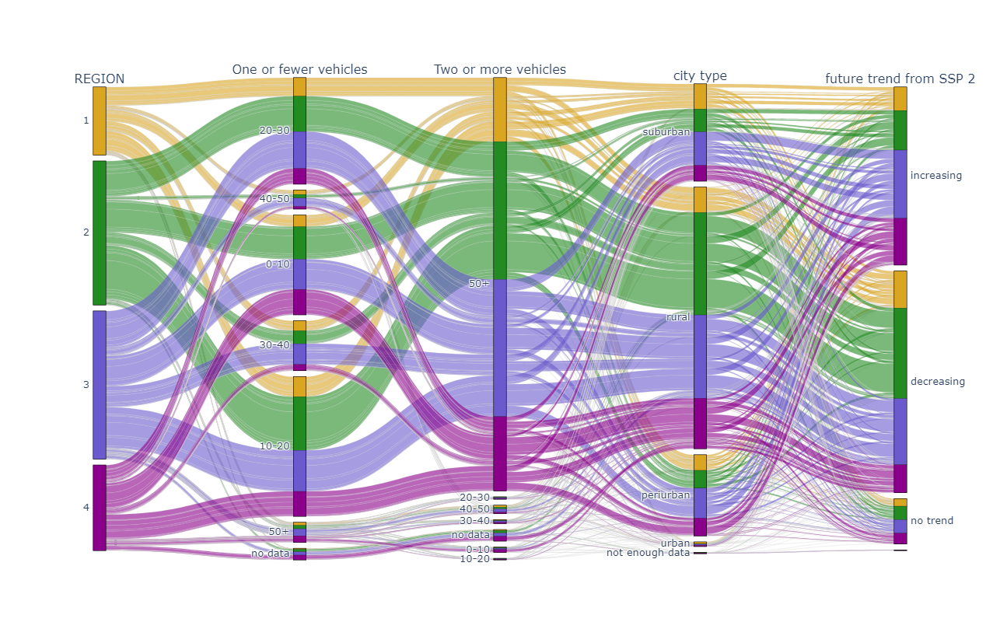

In [10]:
# Build parcats dimensions
categorical_dimensions = ['REGION', 'One or fewer vehicles', 'Two or more vehicles','city type', 'future trend from SSP 2', ];

dimensions = [dict(values=df[label], label=label) for label in categorical_dimensions]

# Build colorscale
color = [x for x in df['REGION']]
colorscale = ['goldenrod','forestgreen','slateblue', 'darkmagenta',]

# Build figure as FigureWidget
fig = go.Figure(go.Parcats(
        # domain={'y': [0, 0.4]}, 
        dimensions=dimensions,
        line={'colorscale': colorscale,
              'color': color, 
              'shape': 'hspline'}))

fig.update_layout(
    height=800,
    # width=1600,
        # dragmode='lasso', hovermode='closest',
        font=dict(
        # family="Courier New, monospace",
        size=16,
        # color="RebeccaPurple"
    ))

fig
# fig.write_html(r'D:\Work\Box Sync\Depop Paper NC\Paper Draft NC\Figures\veh_ownership_populationTrend.html')
# fig.write_image(r'D:\Work\Box Sync\Depop Paper NC\Paper Draft NC\Figures\vehicle_ownership_SSP2.png')

# Income vs Population trend by REGION

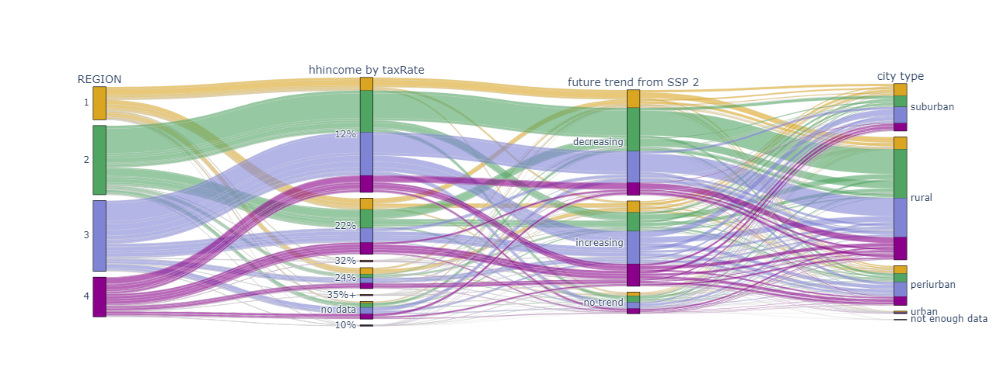

In [10]:
# Build parcats dimensions
categorical_dimensions = ['REGION','hhincome by taxRate', 'future trend from SSP 2', 'city type',];

dimensions = [dict(values=df[label], label=label) for label in categorical_dimensions]

# Build colorscale
color = [x for x in df['REGION']]
colorscale = ['goldenrod','forestgreen','lightblue', 'slateblue', 'darkmagenta']

# Build figure as FigureWidget
fig = go.Figure(go.Parcats(
        # domain={'y': [0, 0.4]}, 
        dimensions=dimensions,
        line={'colorscale': colorscale,
              'color': color, 
              'shape': 'hspline'}))

fig.update_layout(
    height=500,
    width=1000,
        # dragmode='lasso', hovermode='closest',
        font=dict(
        # family="Courier New, monospace",
        size=14,
        # color="RebeccaPurple"
    ))

fig

# fig.write_html(r'D:\Work\Box Sync\Depop Paper NC\Paper Draft NC\Figures\median_income_populationTrend.html')
# fig.write_image(r'D:\Work\Box Sync\Depop Paper NC\Paper Draft NC\Figures\median_income_SSP2.png')

In [24]:
# # Decriptive statistics for vehicle ownership
# df.groupby(['future trend from SSP 2', 'city type', 'REGION'])[['veh_<=_1','veh_2_or+']].describe().round(2)

In [25]:
# # Decriptive statistics for median income
# df.groupby(['future trend from SSP 2', 'city type', 'REGION'])[['median_income']].describe().round(0)

# Check p-values 

In [50]:
df = df_main.copy()

for i in range(len(df)):
    # print(i)
    if df.loc[i,'future trend from SSP 2'] == 'increasing':
        df.loc[i,'future trend from SSP 2'] = 1
    elif df.loc[i,'future trend from SSP 2'] == 'no trend':
        df.loc[i,'future trend from SSP 2'] = 2
    elif df.loc[i,'future trend from SSP 2'] == 'decreasing':
        df.loc[i,'future trend from SSP 2'] = 3

In [51]:
df_south = df[df['REGION'] == 'South'].reset_index(drop = True)[['future trend from SSP 2', 'median_income', 'hh_income_by_taxRate']].dropna()
df_west = df[df['REGION'] == 'West'].reset_index(drop = True)[['future trend from SSP 2', 'median_income', 'hh_income_by_taxRate']].dropna()
df_midwest = df[df['REGION'] == 'Midwest'].reset_index(drop = True)[['future trend from SSP 2', 'median_income', 'hh_income_by_taxRate']].dropna()
df_northeast = df[df['REGION'] == 'Northeast'].reset_index(drop = True)[['future trend from SSP 2', 'median_income', 'hh_income_by_taxRate']].dropna()


In [52]:
# Cross tabulation 
CrosstabResult=pd.crosstab(index=df_south['future trend from SSP 2'],columns=df_south['hh_income_by_taxRate'])
print(CrosstabResult)
# importing the required function
from scipy.stats import chi2_contingency
# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)
# P-Value is the Probability of H0 being True
# If P-Value&gt;0.05 then only we Accept the assumption(H0)
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])
print('\n')
from scipy.stats import f_oneway
# Perform one-way ANOVA
f_statistic, p_value = f_oneway(*[group['median_income'].values for name, group in df_south.groupby("future trend from SSP 2")])
# Print results
print('----Statistics from one way ANOVA----')
print("F-Statistic:", f_statistic)
print("P-value:", p_value)
print('\n')
# Kuruskul Wallis Test
from scipy.stats import kruskal
#perform Kruskal-Wallis Test 
H_statistic, p_value = kruskal(*[group["median_income"].values for name, group in df_south.groupby("future trend from SSP 2")])
print('----Statistics from Kruskal-Wallis----')
print("H-Statistic:", H_statistic)
print("P-value:", p_value)

hh_income_by_taxRate     10%   12%   22%  24%  32%  35%+
future trend from SSP 2                                 
1                         11  2279  1447  659   53    31
2                          7   608   172   32    1     0
3                         39  3406   477  101    1     1
The P-Value of the ChiSq Test is: 3.0409471316678297e-263


----Statistics from one way ANOVA----
F-Statistic: 818.4671241829361
P-value: 0.0


----Statistics from Kruskal-Wallis----
H-Statistic: 1808.874071342676
P-value: 0.0


In [53]:
# Cross tabulation 
CrosstabResult=pd.crosstab(index=df_west['future trend from SSP 2'],columns=df_west['hh_income_by_taxRate'])
print(CrosstabResult)
# importing the required function
from scipy.stats import chi2_contingency
# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)
# P-Value is the Probability of H0 being True
# If P-Value&gt;0.05 then only we Accept the assumption(H0)
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])
print('\n')
from scipy.stats import f_oneway
# Perform one-way ANOVA
f_statistic, p_value = f_oneway(*[group['median_income'].values for name, group in df_west.groupby("future trend from SSP 2")])
# Print results
print('----Statistics from one way ANOVA----')
print("F-Statistic:", f_statistic)
print("P-value:", p_value)
print('\n')
# Kuruskul Wallis Test
from scipy.stats import kruskal
#perform Kruskal-Wallis Test 
H_statistic, p_value = kruskal(*[group["median_income"].values for name, group in df_west.groupby("future trend from SSP 2")])
print('----Statistics from Kruskal-Wallis----')
print("H-Statistic:", H_statistic)
print("P-value:", p_value)


hh_income_by_taxRate     10%   12%   22%  24%  32%  35%+
future trend from SSP 2                                 
1                         11  1049  1186  648   42    32
2                          1   365   184   64    1     1
3                         16  1038   326   56    2     0
The P-Value of the ChiSq Test is: 1.9543788075541208e-131


----Statistics from one way ANOVA----
F-Statistic: 329.6074734433045
P-value: 3.1935135789049384e-135


----Statistics from Kruskal-Wallis----
H-Statistic: 757.8376529163778
P-value: 2.739331426855337e-165


In [54]:
# Cross tabulation 
CrosstabResult=pd.crosstab(index=df_northeast['future trend from SSP 2'],columns=df_northeast['hh_income_by_taxRate'])
print(CrosstabResult)
# importing the required function
from scipy.stats import chi2_contingency
# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)
# P-Value is the Probability of H0 being True
# If P-Value&gt;0.05 then only we Accept the assumption(H0)
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])
print('\n')
from scipy.stats import f_oneway
# Perform one-way ANOVA
f_statistic, p_value = f_oneway(*[group['median_income'].values for name, group in df_northeast.groupby("future trend from SSP 2")])
# Print results
print('----Statistics from one way ANOVA----')
print("F-Statistic:", f_statistic)
print("P-value:", p_value)
print('\n')
# Kuruskul Wallis Test
from scipy.stats import kruskal
#perform Kruskal-Wallis Test 
H_statistic, p_value = kruskal(*[group["median_income"].values for name, group in df_northeast.groupby("future trend from SSP 2")])
print('----Statistics from Kruskal-Wallis----')
print("H-Statistic:", H_statistic)
print("P-value:", p_value)

hh_income_by_taxRate     10%   12%  22%  24%  32%  35%+
future trend from SSP 2                                
1                          0   325  644  542   47    31
2                          1   189  211   97    6     0
3                          4  1384  771  267   10     8
The P-Value of the ChiSq Test is: 4.116473674286151e-138


----Statistics from one way ANOVA----
F-Statistic: 368.04642682253734
P-value: 7.613507348138938e-149


----Statistics from Kruskal-Wallis----
H-Statistic: 706.4916301062717
P-value: 3.866266326937705e-154


In [55]:
# Cross tabulation 
CrosstabResult=pd.crosstab(index=df_midwest['future trend from SSP 2'],columns=df_midwest['hh_income_by_taxRate'])
print(CrosstabResult)
# importing the required function
from scipy.stats import chi2_contingency
# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)
# P-Value is the Probability of H0 being True
# If P-Value&gt;0.05 then only we Accept the assumption(H0)
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])
print('\n')
from scipy.stats import f_oneway
# Perform one-way ANOVA
f_statistic, p_value = f_oneway(*[group['median_income'].values for name, group in df_midwest.groupby("future trend from SSP 2")])
# Print results
print('----Statistics from one way ANOVA----')
print("F-Statistic:", f_statistic)
print("P-value:", p_value)
print('\n')
# Kuruskul Wallis Test
from scipy.stats import kruskal
#perform Kruskal-Wallis Test 
H_statistic, p_value = kruskal(*[group["median_income"].values for name, group in df_midwest.groupby("future trend from SSP 2")])
print('----Statistics from Kruskal-Wallis----')
print("H-Statistic:", H_statistic)
print("P-value:", p_value)

hh_income_by_taxRate     10%   12%   22%  24%  32%  35%+
future trend from SSP 2                                 
1                          7  1216  1036  301   16    14
2                          4   517   292   73    1     1
3                         20  4363  1384  167   11     3
The P-Value of the ChiSq Test is: 3.821526111351939e-138


----Statistics from one way ANOVA----
F-Statistic: 370.59450856395364
P-value: 1.1727179146697056e-155


----Statistics from Kruskal-Wallis----
H-Statistic: 715.7157547722887
P-value: 3.839711067486734e-156
